In [152]:
import numpy as np 

In [153]:
import matplotlib.pyplot as plt
%matplotlib inline

#Make sure that caffe is on the python path:
caffe_root='../'

In [154]:
import sys
sys.path.insert(0,caffe_root+'python')

In [155]:
import caffe
plt.rcParams['figure.figsize']=(10,10)
plt.rcParams['image.interpolation']='nearest'
plt.rcParams['image.cmap']='gray'

import os
import math
print 'timnit now2'

timnit now2


In [156]:
#caffe.set_mode_cpu()
#net=caffe.Net(caffe_root+'timnit_models/conv1/invert_alexnet_conv1_deploy.prototxt',

#             caffe_root+'timnit_models/conv1/invert_alexnet_conv1.caffemodel')
gammas=['0.1','0.3','0.5','1']
stepsizes=['500','1000','3000','5000','10000']
weight_decays=['0','0.0001','0.0005','0.005','0.05']
iterations=['2000','4000','6000','8000','10000']

lr='0.00000000001'
momentum='0.9'
max_iter='50000'
stepsize=stepsizes[-1]
gamma=gammas[2]
weight_decay=weight_decays[3]
iteration=iterations[-1]

suffix='%s.%s.%s.%s.%s.%s'%(lr,gamma,stepsize,momentum,
                               weight_decay,max_iter)

sizes=['tiny','small','big']

#model1_name='summer_winter/tiny/snapshot/%s.summer_winter_iter_%s'%(suffix,iteration)
model1_name='_iter_24000'
model2_name=model1_name
model3_name=model1_name
model4_name=model1_name

'''
model2_name='winter_summer/snapshot/%s.winter_summer_iter_%s'%(suffix,iteration)
model3_name='same/snapshot/%s.same_iter_%s'%(suffix,iteration)
model4_name='invert_alexnet_conv1.caffemodel'
'''

#val1_name='0.047_0.671_0.092_1.898/train_0.047_0.671_0.092_1.898'
val1_name='train_summer_winter'
val2_name=val1_name
val3_name=val1_name
val4_name=val1_name
'''
val2_name='winter_summer/train_winter_summer'
val3_name='same/train_same'
val4_name='same/train_same'
'''

net1=caffe.Net(caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/%s.prototxt'%val1_name,
              caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/tiny/%s'%model1_name)
net2=caffe.Net(caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/%s.prototxt'%val2_name,
              caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/tiny/%s'%model2_name)
net3=caffe.Net(caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/%s.prototxt'%val3_name,
              caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/tiny/%s'%model3_name)
net4=caffe.Net(caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/%s.prototxt'%val3_name,
              caffe_root+'timnit_models/att_conv1/timelapse_summer_winter/tiny/%s'%model4_name)
#solver = caffe.SGDSolver(caffe_root+'timnit_models/att_conv1/solver_gpu.prototxt')

In [157]:
image_mean=np.load(caffe_root + 'python/caffe/imagenet/ilsvrc_2012_mean.npy').mean(1).mean(1) # mean pixel

save_dir='/imagenetdb3/tgebru/pascal_experiments'
if 'train' in val1_name:
 train_test='train'
else:
 train_test='test'     
base_dir=os.path.join(save_dir,model1_name.split('/')[0],train_test)
print base_dir
if not os.path.exists(base_dir):
    os.makedirs(base_dir)

/imagenetdb3/tgebru/pascal_experiments/_iter_20000/train


In [158]:
tg_mean=np.load(caffe_root + 'python/caffe/imagenet/ilsvrc_2012_mean.npy')
mean227=np.load('./mean227.npy')
mean216=np.load('./mean216.npy')

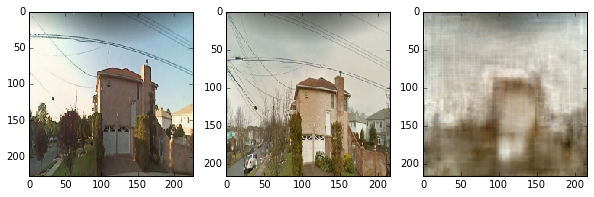

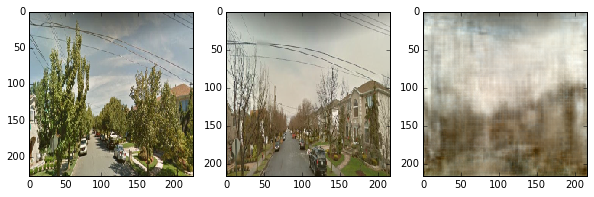

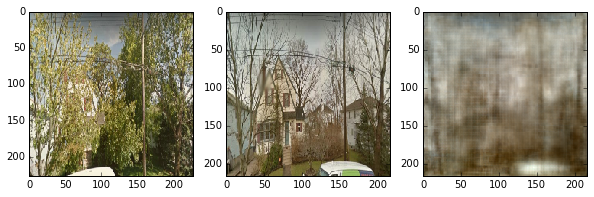

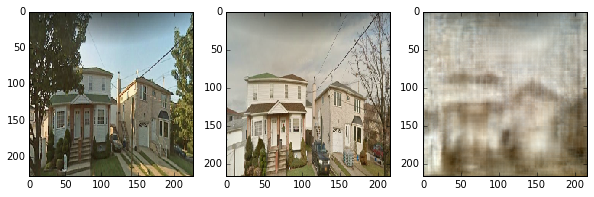

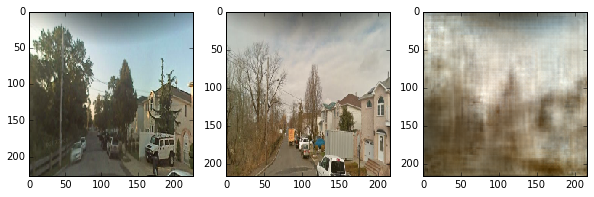

...

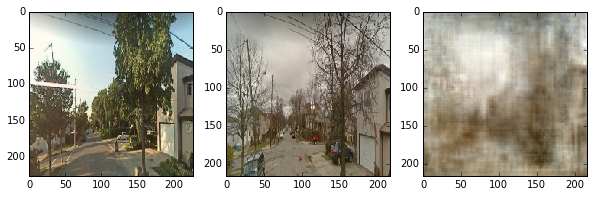

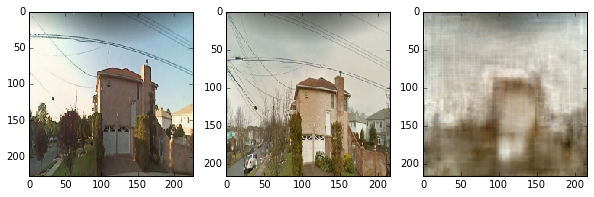

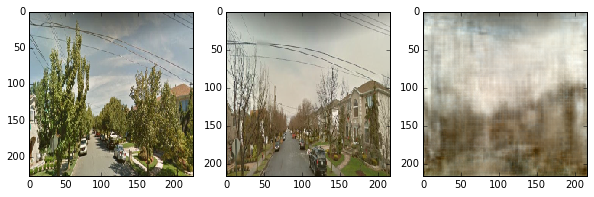

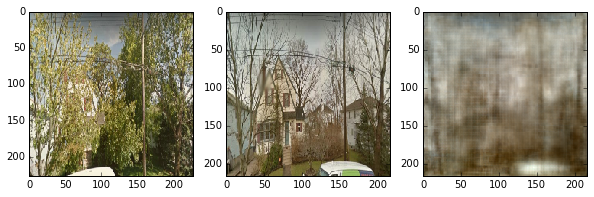

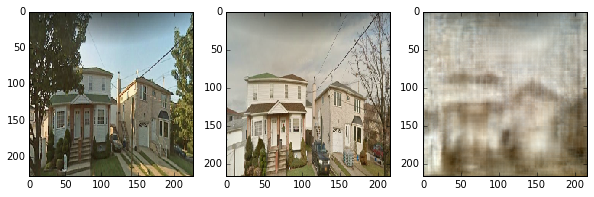

In [159]:
plt.rcParams['figure.figsize'] = (10, 10)
#NUM_IMS=1713 #pascal=13699 train, 1713 test
NUM_IMS=10 #tiny timelapse
out1 = net1.forward(['deconv0'])
num_loops=0
all_ims_loop=0
#while True:
max_num_loops=math.ceil(NUM_IMS/out1['deconv0'].shape[0]) 
#out2 = net2.forward(['deconv0'])
#out3 = net3.forward(['deconv0'])
#out4 = net4.forward(['deconv0'])
channel_swap=(2,1,0) 
transpose=(2,0,1)
for im_num in range(out1['deconv0'].shape[0]):
    all_ims_loop += 1
    #if im_num==100:break
    #Input Image
    data_in1=net1.blobs['source_ims'].data[im_num].copy().squeeze()
    data_in1 += mean227;
    #data_in1 /=255.0
    data_in1 -= data_in1.min();
    data_in1 /= (data_in1.max()-data_in1.min())
    data_in1=data_in1[channel_swap,:,:]
    data_in1=data_in1.transpose([transpose[t] for t in transpose])

    '''
    data_in2=net2.blobs['source_ims'].data[im_num].copy().squeeze()
    data_in2[0,:,:]=data_in2[0,:,:]+image_mean[0]
    data_in2[1,:,:]=data_in2[1,:,:]+image_mean[1]
    data_in2[2,:,:]=data_in2[2,:,:]+image_mean[2]
    data_in2 /=255.0
    data_in2=data_in2[channel_swap,:,:]
    data_in2=data_in2.transpose([transpose[t] for t in transpose])


    data_in3=net3.blobs['source_ims'].data[im_num].copy().squeeze()
    data_in3[0,:,:]=data_in3[0,:,:]+image_mean[0]
    data_in3[1,:,:]=data_in3[1,:,:]+image_mean[1]
    data_in3[2,:,:]=data_in3[2,:,:]+image_mean[2]
    data_in3 /=255.0
    data_in3=data_in3[channel_swap,:,:]
    data_in3=data_in3.transpose([transpose[t] for t in transpose])

    data_in4=net4.blobs['source_ims'].data[im_num].copy().squeeze()
    data_in4[0,:,:]=data_in4[0,:,:]+image_mean[0]
    data_in4[1,:,:]=data_in4[1,:,:]+image_mean[1]
    data_in4[2,:,:]=data_in4[2,:,:]+image_mean[2]
    data_in4 /=255.0
    data_in4=data_in4[channel_swap,:,:]
    data_in4=data_in4.transpose([transpose[t] for t in transpose])
    '''

    #Input target image
    target_in1=net1.blobs['target_ims'].data[im_num].copy().squeeze()
    target_in1 += mean216;
    #target_in1 /=255.0
    target_in1 -= target_in1.min();
    target_in1 /= (target_in1.max()-target_in1.min())
    target_in1=target_in1[channel_swap,:,:]
    target_in1=target_in1.transpose([transpose[t] for t in transpose])

    '''
    target_in2=net2.blobs['target_ims'].data[im_num].copy().squeeze()
    target_in2[0,:,:]=target_in2[0,:,:]+image_mean[0]
    target_in2[1,:,:]=target_in2[1,:,:]+image_mean[1]
    target_in2[2,:,:]=target_in2[2,:,:]+image_mean[2]
    target_in2 /=255.0
    target_in2=target_in2[channel_swap,:,:]
    target_in2=target_in2.transpose([transpose[t] for t in transpose])

    target_in3=net3.blobs['target_ims'].data[im_num].copy().squeeze()
    target_in3[0,:,:]=target_in3[0,:,:]+image_mean[0]
    target_in3[1,:,:]=target_in3[1,:,:]+image_mean[1]
    target_in3[2,:,:]=target_in3[2,:,:]+image_mean[2]
    target_in3 /=255.0
    target_in3=target_in3[channel_swap,:,:]
    target_in3=target_in3.transpose([transpose[t] for t in transpose])

    target_in4=net4.blobs['target_ims'].data[im_num].copy().squeeze()
    target_in4[0,:,:]=target_in4[0,:,:]+image_mean[0]
    target_in4[1,:,:]=target_in4[1,:,:]+image_mean[1]
    target_in4[2,:,:]=target_in4[2,:,:]+image_mean[2]
    target_in4 /=255.0
    target_in4=target_in4[channel_swap,:,:]
    target_in4=target_in4.transpose([transpose[t] for t in transpose])
    '''

    #Output Image
    data_out1=out1['deconv0'][im_num].copy().squeeze()
    data_out1 += mean216
    #data_out1 /=255.0
    data_out1 -= data_out1.min();
    data_out1 /= (data_out1.max()-data_out1.min())
    data_out1=data_out1[channel_swap,:,:]
    data_out1=data_out1.transpose([transpose[t] for t in transpose])
    '''
    data_out2=out2['deconv0'][im_num].copy().squeeze()
    data_out2[0,:,:]=data_out2[0,:,:]+image_mean[0]
    data_out2[1,:,:]=data_out2[1,:,:]+image_mean[1]
    data_out2[2,:,:]=data_out2[2,:,:]+image_mean[2]
    data_out2 /=255.0
    data_out2=data_out2[channel_swap,:,:]
    data_out2=data_out2.transpose([transpose[t] for t in transpose])

    data_out3=out3['deconv0'][im_num].copy().squeeze()
    data_out3[0,:,:]=data_out3[0,:,:]+image_mean[0]
    data_out3[1,:,:]=data_out3[1,:,:]+image_mean[1]
    data_out3[2,:,:]=data_out3[2,:,:]+image_mean[2]
    data_out3 /=255.0
    data_out3=data_out3[channel_swap,:,:]
    data_out3=data_out3.transpose([transpose[t] for t in transpose])

    data_out4=out4['deconv0'][im_num].copy().squeeze()
    data_out4[0,:,:]=data_out4[0,:,:]+image_mean[0]
    data_out4[1,:,:]=data_out4[1,:,:]+image_mean[1]
    data_out4[2,:,:]=data_out4[2,:,:]+image_mean[2]
    data_out4 /=255.0
    data_out4=data_out4[channel_swap,:,:]
    data_out4=data_out4.transpose([transpose[t] for t in transpose])
    '''


    fig, ax1 = plt.subplots()
    plt.subplot(1,3,1)
    plt.imshow(data_in1)
    plt.subplot(1,3,2)
    plt.imshow(target_in1)
    plt.subplot(1,3,3)
    plt.imshow(data_out1)
    '''
    plt.subplot(2,3,4)
    plt.imshow(data_in2)
    plt.subplot(2,3,5)
    plt.imshow(target_in2)
    plt.subplot(2,3,6)
    plt.imshow(data_out2)


    plt.subplot(4,3,7)
    plt.imshow(data_in3)
    plt.subplot(4,3,8)
    plt.imshow(target_in3)
    plt.subplot(4,3,9)
    plt.imshow(data_out3)
    plt.subplot(4,3,10)
    plt.imshow(data_in4)
    plt.subplot(4,3,11)
    plt.imshow(target_in4)
    plt.subplot(4,3,12)
    plt.imshow(data_out4)
    '''
    img_file='/%s/%s'%(base_dir,all_ims_loop)
    fig.savefig(img_file, bbox_inches='tight')
    num_loops+=1
    #if num_loops>=max_num_loops:
    #    break

In [119]:
din_unscaled=net1.blobs['source_ims'].data[im_num]
dout_unscaled=out['deconv0'][im_num].copy()
target_unscaled=net1.blobs['target_ims'].data[im_num]
np.square(np.linalg.norm(dout_unscaled-target_unscaled))

NameError: name 'out' is not defined

In [13]:
%pylab inline


Populating the interactive namespace from numpy and matplotlib
63


`%matplotlib` prevents importing * from pylab and numpy


In [149]:
print net.blobs['target_ims'].data[0].min(),net.blobs['target_ims'].data[0].max()
print out['deconv0'][0].min(), out['deconv0'][0].max()
print out2['deconv0'][0].min(), out2['deconv0'][0].max()

#print np.linalg.norm(out['deconv0'][0]-net.blobs['target_ims'].data[0])
#print image_mean
#im=plt.imread('../../../timnit_caffe/examples/images/cat.jpg')
#print (im-image_mean).min(),(im-image_mean).max()

-89.8619 159.92
-445175.0 299946.0
4.24834e+07
[ 104.00698793  116.66876762  122.67891434]


In [86]:
print net1.params['deconv0'][0].data.min(),net1.params['deconv0'][0].data.max()
print net2.params['deconv0'][0].data.min(),net2.params['deconv0'][0].data.max()
print net3.params['deconv0'][0].data.min(),net3.params['deconv0'][0].data.max()



tiny_invert_summer_winter_iter_10000
-0.108746 0.0956978
-0.109071 0.111776
-0.105189 0.100714


1.4898071

hi
